In [1]:
import trimesh
import potpourri3d as pp3d
import numpy as np
import pyvista as pv
from scipy.spatial import KDTree
import gdist
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import meshlib.mrmeshpy as mr

In [7]:
def unify_vertices(source_file_path, tolerance=1e-5):
    mesh = trimesh.load(source_file_path)
    
    vertices = mesh.vertices
    faces = mesh.faces

    # Step 1: Find unique vertices within the given tolerance
    kdtree = KDTree(vertices)
    unique_indices = {}
    canonical_vertices = []
    
    for i, vertex in enumerate(vertices):
        if i in unique_indices:
            continue  # Skip if already mapped to a canonical vertex
        
        # Find all vertices within the tolerance distance
        duplicate_indices = kdtree.query_ball_point(vertex, tolerance)
        
        # Use the first duplicate as the "canonical" vertex and map all duplicates to it
        canonical_index = len(canonical_vertices)
        canonical_vertices.append(vertex)
        
        for idx in duplicate_indices:
            unique_indices[idx] = canonical_index

    # Step 2: Update faces to use only unique vertices
    new_faces = np.array([[unique_indices[vi] for vi in face] for face in faces])

    # Step 3: Create the new unified mesh
    unified_mesh = trimesh.Trimesh(vertices=np.array(canonical_vertices), faces=new_faces)

    output_path = source_file_path[:-4] + '_fixed.obj'
    unified_mesh.export(output_path)
    print(f'Mesh unified and saved to {output_path}')

In [ ]:
def remove_duplicate_edges(source_file_path):
    mesh = trimesh.load(source_file_path)

    edges = mesh.edges
    faces = mesh.faces
    sorted_edges = np.sort(edges, axis=1)

    # Find unique edges
    _, unique_indices = np.unique(sorted_edges, axis=0, return_index=True)
    unique_edges = edges[unique_indices]

    # Find the vertices used by unique edges
    unique_vertices = np.unique(unique_edges)

    # Remap vertices for the unique edges
    vertex_map = {old_index: new_index for new_index, old_index in enumerate(unique_vertices)}
    remapped_vertices = np.array([vertex_map[vertex] for vertex in unique_vertices])

    # Recreate the mesh using the unique edges and remapped vertices
    new_mesh = trimesh.Trimesh(vertices=mesh.vertices[remapped_vertices], faces=faces, process=False)

    output_path = source_file_path[:-4] + '_edges_cleaned.obj'
    new_mesh.export(output_path)
    print(f'Mesh cleaned and saved to {output_path}')


In [1]:
def remove_faces_by_indices(mesh, face_indices):
    # Convert face_indices to a set for fast exclusion
    face_indices_set = set(face_indices)

    # Create a mask that selects all faces except those we want to remove
    mask = [i not in face_indices_set for i in range(len(mesh.faces))]

    # Filter the faces array
    new_faces = mesh.faces[mask]

    # Recreate the mesh with the remaining faces
    new_mesh = trimesh.Trimesh(vertices=mesh.vertices, faces=new_faces, process=False)
    
    return new_mesh

In [3]:
def show_mesh(mesh, distances =None, sources= None, intrinsic_vectors=None):
    plotter = pv.Plotter()
    normalized_distances = None
    if distances is not None:
        normalized_distances = (distances - distances.min()) / (distances.max() - distances.min())
        plotter.add_points(mesh.vertices[sources].reshape(sources.shape[0], 3), color="red", render_points_as_spheres=True, point_size=10)
        #plotter.add_point_labels(mesh.vertices[sources].reshape(sources.shape[0], 3), sources.tolist(), point_size=20, font_size=36)
        #for source in sources:
        #    print(source, mesh.vertices[source])
        #    plotter.add_point_labels(mesh.vertices[source],str(source), font_size=20)
    faces_with_sizes = np.hstack([np.full((mesh.faces.shape[0], 1), 3), mesh.faces]).flatten()
    pv_mesh = pv.PolyData(mesh.vertices, faces_with_sizes)
    colors = np.tile(["white", "blue"], 10)
    cmap = ListedColormap(colors)
    plotter.add_mesh(pv_mesh, scalars=normalized_distances, cmap=cmap, show_edges=False)
    
    if intrinsic_vectors is not None:
        vector_solver = pp3d.MeshVectorHeatSolver(mesh.vertices, mesh.faces)
        basisX, basisY, basisN = vector_solver.get_tangent_frames()
        ext3D = intrinsic_vectors[:,0,np.newaxis] * basisX +  intrinsic_vectors[:,1,np.newaxis] * basisY
        mean_edge_length = mesh.edges_unique_length.mean()
        plotter.add_arrows(mesh.vertices, ext3D, mag=mean_edge_length)
    plotter.show(title="Geodesic Distance Visualization")
    plotter.close()

def show_shm_geodesic(mesh, point_a, point_b):
    plotter = pv.Plotter()
    distances = get_scalar_heat_geodesic(mesh, np.array([point_a]))

    track = [point_b]
    edges = mesh.edges
    while track[-1] != point_a:
        current_point = track[-1]
        connected_edges = [edge for edge in edges if current_point in edge]
        vertices = [] 
        for [v1, v2] in connected_edges:
            if v1 == current_point:
                vertices.append(v2)
            else:
                vertices.append(v1)
        next_point = vertices[np.argmin(distances[vertices])]
        track.append(next_point)
    
    plotter.add_lines(mesh.vertices[track], width=3, color='red', connected=True, label=f'Shortest path {distances[point_b]:.2f}')
    faces_with_sizes = np.hstack([np.full((mesh.faces.shape[0], 1), 3), mesh.faces]).flatten()
    pv_mesh = pv.PolyData(mesh.vertices, faces_with_sizes)
    colors = np.tile(["white", "blue"], 10)
    cmap = ListedColormap(colors)
    plotter.add_mesh(pv_mesh, scalars=None, cmap=cmap, show_edges=False)
    plotter.add_legend(bcolor='w', face=None)
    plotter.show(title="Geodesic Distance Visualization")
    plotter.close()

In [4]:
mesh_name = 'dragon.obj'
mesh = trimesh.load(mesh_name)
involved_faces = []
for i, (x, y, z) in enumerate(mesh.faces):
    if 34687 in [x,y,z] or 34704 in [x,y,z]:
        involved_faces.append(i)
        #print(i)
#print(mesh.vertices.shape)
mesh = remove_faces_by_indices(mesh, involved_faces)
mesh.remove_unreferenced_vertices()
output_path = mesh_name[:-4] + '_cleaned.obj'
mesh.export(output_path)

'# https://github.com/mikedh/trimesh\nv -20.15376900 -12.40811300 2.07442200\nv -52.04650900 -13.82830900 -7.94147100\nv -51.49607800 -13.66653200 -7.89796500\nv -51.89180400 -13.54309700 -8.26391300\nv -52.52695100 -13.43025300 -9.55659500\nv -51.91469200 -12.80775500 -9.28872600\nv -34.23747600 -16.72394000 -3.16103600\nv -35.22977400 -16.07158700 -3.57808000\nv -34.78391600 -15.83361600 -3.80176600\nv -34.43833900 -15.51928900 -3.97453800\nv -34.14506900 -15.17970500 -4.24695000\nv -33.74756600 -14.54937500 -4.62269400\nv -59.70480700 -10.87500700 -7.46758000\nv -60.38473100 -10.75240400 -7.58519300\nv -61.07501200 -10.73003600 -7.83830400\nv -44.74946200 -14.15856100 -9.01516200\nv -44.41687800 -14.46523700 -8.35768800\nv -42.43578700 -12.72694500 -4.87891600\nv -47.62167700 -14.11688100 -9.55164500\nv -46.41763300 -14.26511400 -9.13516100\nv -44.03470600 -14.28504500 -8.68311000\nv -47.07753400 -13.90479200 -9.81861200\nv -45.48415000 -14.31838300 -8.88901400\nv -44.92424000 -14.0

In [19]:
import time

def all_shm(mesh, source):
    heat_solver = pp3d.MeshHeatMethodDistanceSolver(mesh.vertices, mesh.faces)
    return heat_solver.compute_distance_multisource(source)

def preprocessed_shm(solver, source):
    return solver.compute_distance_multisource(source)

def get_exact_geodesic(mesh, vertex_indices):
    vertices = mesh.vertices
    faces = mesh.faces
    geodesic_distances = gdist.compute_gdist(
        vertices.astype(np.float64),
        faces.astype(np.int32),
        vertex_indices
    )
    return geodesic_distances

def fmm(mesh, vertex_indices):
    return mr.computeSurfaceDistances(mesh, vertex_indices)

meshes = ['cow.obj', 'stanford-bunny.obj', 'horse.obj', 'dragon_cleaned.obj']


print('Preprocessed times')
all_shm_times = np.zeros((len(meshes), 10)) 
for i, mesh_name in enumerate(meshes):
    #print(f'Mesh: {mesh_name}')
    mesh = trimesh.load(mesh_name)
    for j in range(10):
        #print(f'Repetition {j}')
        source = np.array([np.random.randint(len(mesh.vertices))])
        t0 = time.time()
        all_shm(mesh, source)
        t1 = time.time()
        all_shm_times[i, j] = t1 - t0

print('Preprocessing times 1')
preprocessed_shm_times = np.zeros((len(meshes), 10)) 
for i, mesh_name in enumerate(meshes):
    #print(f'Mesh: {mesh_name}')
    mesh = trimesh.load(mesh_name)
    solver = pp3d.MeshHeatMethodDistanceSolver(mesh.vertices, mesh.faces)
    for j in range(10):
        #print(f'Repetition {j}')
        source = np.array([np.random.randint(len(mesh.vertices))])
        t0 = time.time()
        preprocessed_shm(solver, source)
        t1 = time.time()
        preprocessed_shm_times[i, j] = t1 - t0


print('Preprocessing times 2')
preprocessing_times = np.zeros((len(meshes))) 
for i, mesh_name in enumerate(meshes):
    #print(f'Mesh: {mesh_name}')
    mesh = trimesh.load(mesh_name)
    t0 = time.time()
    solver = pp3d.MeshHeatMethodDistanceSolver(mesh.vertices, mesh.faces)
    t1 = time.time()
    preprocessing_times[i] = t1 - t0

print('Slow method:')
slow_method_times = np.zeros((len(meshes), 10)) 
for i, mesh_name in enumerate(meshes):
    #print(f'Mesh: {mesh_name}')
    mesh = trimesh.load(mesh_name)
    for j in range(10):
        #print(f'Repetition {j}')
        source = np.array([np.random.randint(len(mesh.vertices))])
        t0 = time.time()
        get_exact_geodesic(mesh, source)
        t1 = time.time()
        slow_method_times[i, j] = t1 - t0


Preprocessed times
Preprocessing times 1
Preprocessing times 2
Slow method:


In [20]:
print('All SHM time means:', np.mean(all_shm_times, axis=1))
print('All SHM time std:', np.std(all_shm_times, axis=1))
print('Preprocessing times:', preprocessing_times)
print('Preprocessed time means:', np.mean(preprocessed_shm_times, axis=1))
print('Preprocessed time std:', np.std(preprocessed_shm_times, axis=1))
print('Slow method time means:', np.mean(slow_method_times, axis=1))
print('Slow method time std:', np.std(slow_method_times, axis=1))


All SHM time means: [0.02105727 0.47812152 0.5857688  1.63696287]
All SHM time std: [0.00241842 0.01417797 0.02069545 0.02603699]
Preprocessing times: [0.05665779 0.48824167 0.56547475 1.55148554]
Preprocessed time means: [0.00125623 0.02360642 0.03351047 0.10406697]
Preprocessed time std: [0.00044711 0.00233795 0.0059222  0.02045945]
Slow method time means: [0.03114603 1.34824607 2.87881885 2.79824367]
Slow method time std: [0.00099096 0.07125676 0.22296689 0.07929328]


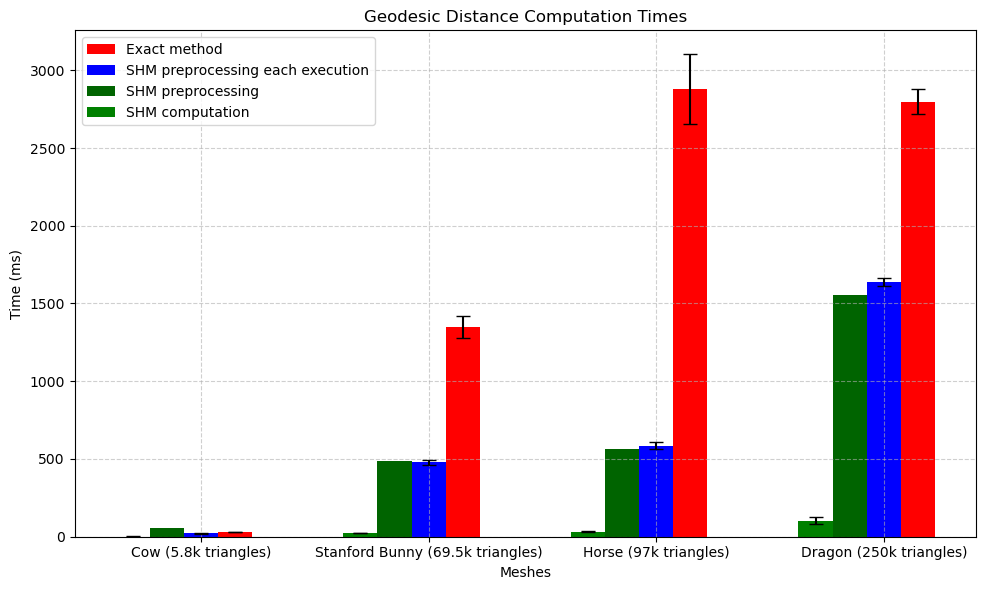

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
meshes = ['Cow (5.8k triangles)', 'Stanford Bunny (69.5k triangles)', 'Horse (97k triangles)', 'Dragon (250k triangles)']
all_shm_means = np.mean(all_shm_times, axis=1) * 1000  # Convert to ms
all_shm_stds = np.std(all_shm_times, axis=1) * 1000  # Convert to ms
preprocessing_times_ms = preprocessing_times * 1000  # Convert to ms
preprocessed_means = np.mean(preprocessed_shm_times, axis=1) * 1000  # Convert to ms
preprocessed_stds = np.std(preprocessed_shm_times, axis=1) * 1000  # Convert to ms
slow_means = np.mean(slow_method_times, axis=1) * 1000  # Convert to ms
slow_stds = np.std(slow_method_times, axis=1) * 1000  # Convert to ms

# Preprocessed times with preprocessing
preprocessed_total_means = preprocessed_means# + preprocessing_times

# Create the plot
x = np.arange(len(meshes))  # Label locations
width = 0.15  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))

# Bars
ax.bar(x + width, slow_means, width, yerr=slow_stds, label='Exact method', capsize=5, color='red')
ax.bar(x, all_shm_means, width, yerr=all_shm_stds, label='SHM preprocessing each execution', capsize=5, color='blue')
ax.bar(x- width, preprocessing_times_ms, width, label='SHM preprocessing', capsize=5, color='grey')
ax.bar(x - 2*width , preprocessed_means, width, yerr=preprocessed_stds, label='SHM computation', capsize=5, color='green')

# Labels and title
ax.set_xlabel('Meshes')
ax.set_ylabel('Time (ms)')
ax.set_title('Geodesic Distance Computation Times')
ax.set_xticks(x)
ax.set_xticklabels(meshes)
ax.legend()

# Grid and layout
ax.grid(True, linestyle='--', alpha=0.6)
fig.tight_layout()

# Show plot
plt.show()
